In [1]:

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet
import plotly.graph_objects as go

/home/ganesh/anaconda3/envs/stock/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df = pd.read_csv('/home/ganesh/Projects/BE_Project/stock_price_prediction/data/tcs.csv')
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,2002-08-12,38.724998,40.000000,38.724998,39.700001,28.121292,212976
1,2002-08-13,39.750000,40.387501,38.875000,39.162498,27.740557,153576
2,2002-08-14,39.250000,39.250000,35.724998,36.462502,25.828011,822776
3,2002-08-15,36.462502,36.462502,36.462502,36.462502,25.828011,0
4,2002-08-16,36.275002,38.000000,35.750000,36.375000,25.766033,811856
...,...,...,...,...,...,...,...
5378,2024-04-10,3956.399902,3990.199951,3918.000000,3984.649902,3984.649902,2101965
5379,2024-04-12,3971.000000,4013.350098,3945.500000,4001.399902,4001.399902,4354821
5380,2024-04-15,4001.399902,4064.199951,3919.050049,3941.199951,3941.199951,4200329
5381,2024-04-16,3902.000000,3928.699951,3862.850098,3872.800049,3872.800049,3051420


# **About Dataset:**

This dataset presents historical stock prices over days, weeks, or months, depending on the granularity of the dataset.  

Key Features:  

* Date: The date of the recorded stock price.
* Open Price: The opening price of Zomato's stock on the given date.
* Close Price: The closing price of Zomato's stock on the given date.
* High Price: The highest price of Zomato's stock reached during the trading day.
* Low Price: The lowest price of Zomato's stock reached during the trading day.
* Volume: The total volume of Zomato's stock traded on the given date.

# **EDA**

In [3]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,5383.000000,5383.000000,5383.000000,5383.000000,5383.000000,5.383000e+03
mean,1196.048987,1208.374168,1182.953161,1195.567123,1080.082522,3.195786e+06
std,1147.694492,1157.687791,1137.166686,1147.412594,1121.725309,3.131023e+06
min,32.474998,36.450001,32.474998,35.474998,25.128519,0.000000e+00
25%,240.000000,243.750000,234.875000,238.943748,173.983749,1.645141e+06
50%,749.000000,758.349976,742.549988,749.700012,602.236328,2.500816e+06
75%,1912.000000,1938.200012,1891.049988,1911.074951,1715.660095,3.950456e+06
max,4215.250000,4254.750000,4177.000000,4219.250000,4219.250000,8.806715e+07


**The above chart gives us a descriptive analytics of stock prizes.**  


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5383 entries, 0 to 5382
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5383 non-null   object 
 1   Open       5383 non-null   float64
 2   High       5383 non-null   float64
 3   Low        5383 non-null   float64
 4   Close      5383 non-null   float64
 5   Adj Close  5383 non-null   float64
 6   Volume     5383 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 294.5+ KB


**As we can see the date column is object type so converting it into datetime format in next cell.**

In [5]:
df['Date'] = pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5383 entries, 0 to 5382
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       5383 non-null   datetime64[ns]
 1   Open       5383 non-null   float64       
 2   High       5383 non-null   float64       
 3   Low        5383 non-null   float64       
 4   Close      5383 non-null   float64       
 5   Adj Close  5383 non-null   float64       
 6   Volume     5383 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 294.5 KB


**Successfully converted.**

### **Checking for the missing value in the dataset**

In [6]:
df.isna().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

**There are no missing values, which is a good news.**

### **Checking the distribution of each column**

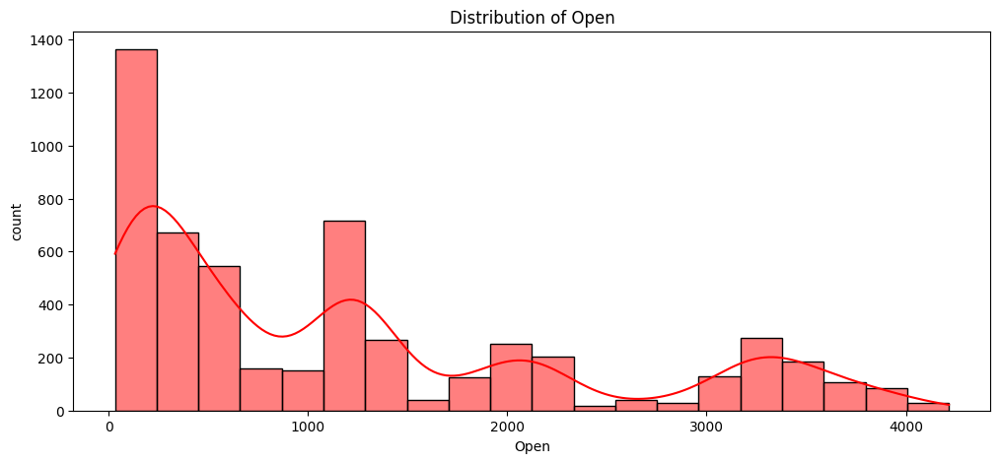

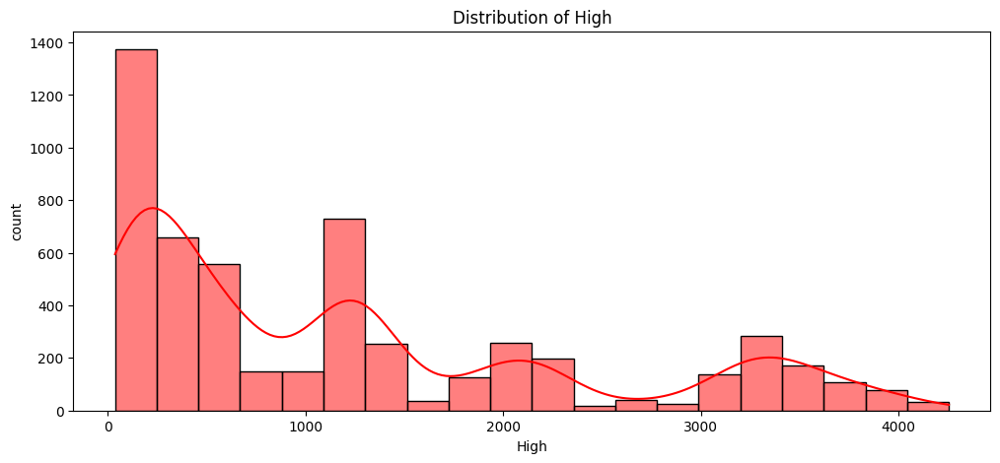

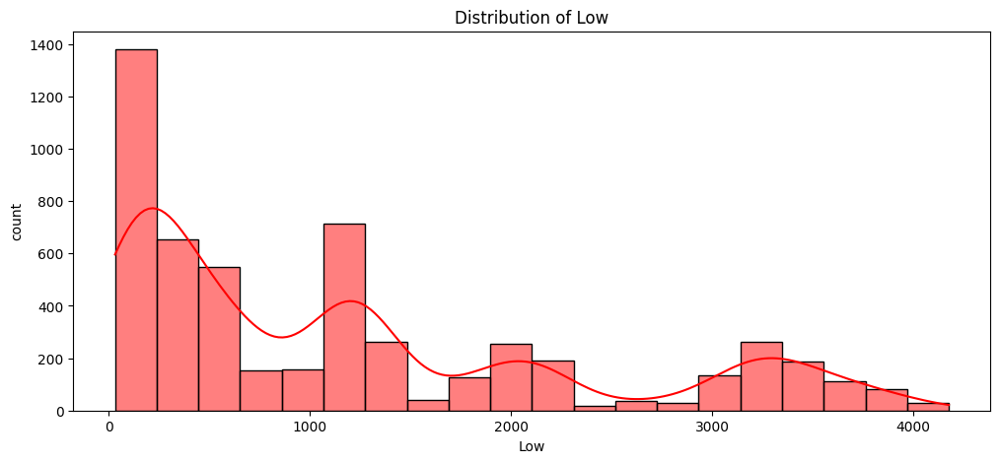

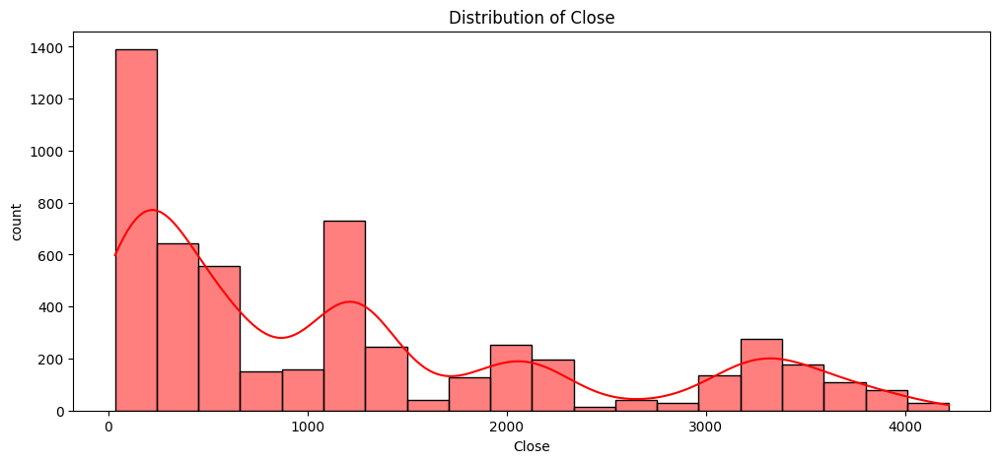

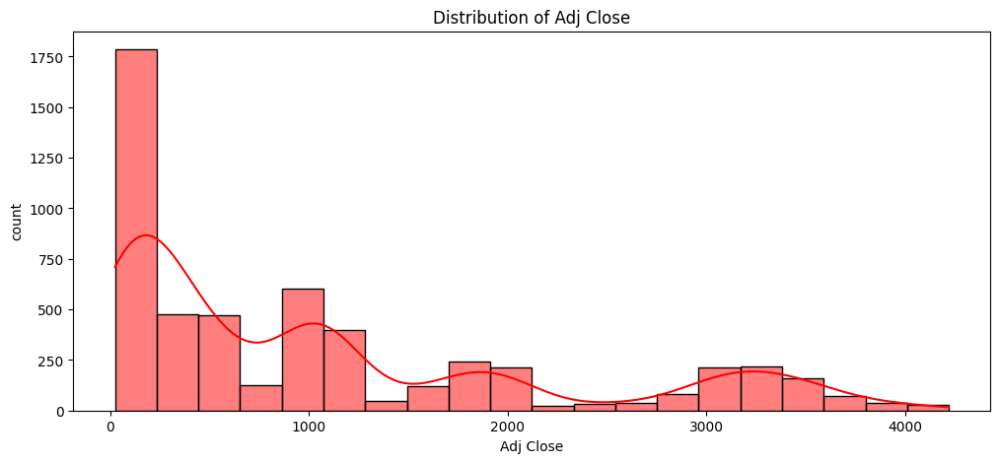

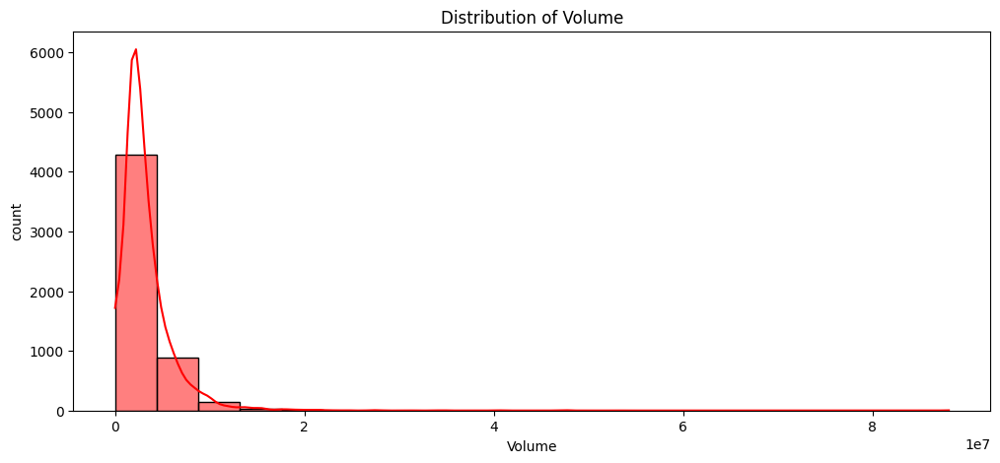

In [7]:
num_cols = df.select_dtypes(include=['int', 'float']).columns
for col in num_cols:
    if df[col].dtype == 'int' or df[col].dtype == 'float':
        plt.figure(figsize=(12,5))
        sns.histplot(data=df, x=df[col], kde=True, bins=20,color='r')
        plt.ylabel('count')
        plt.title(f'Distribution of {col}')
        plt.show()

### **Checking the Boxplot to find if there are any outliers or not**

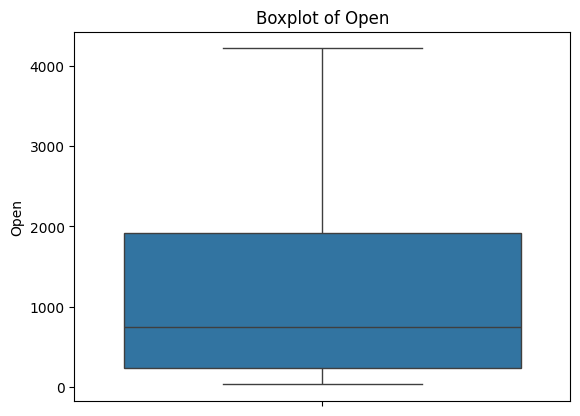

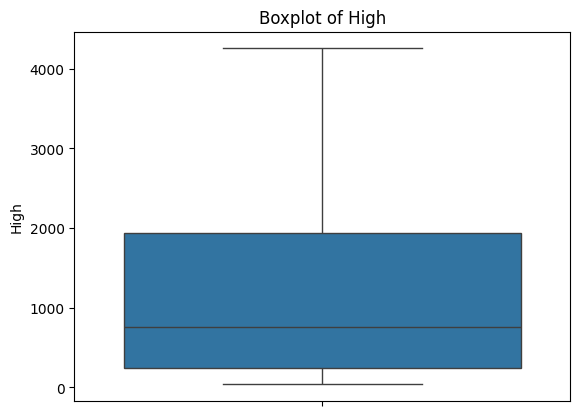

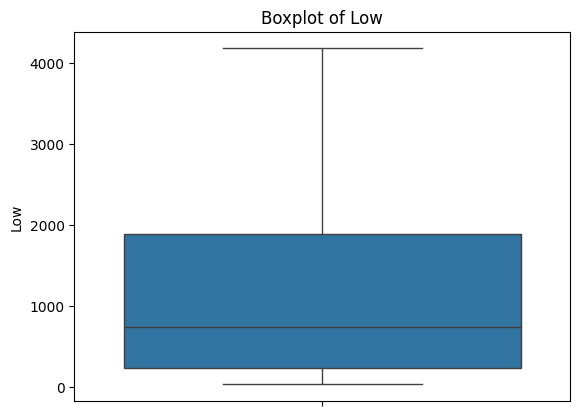

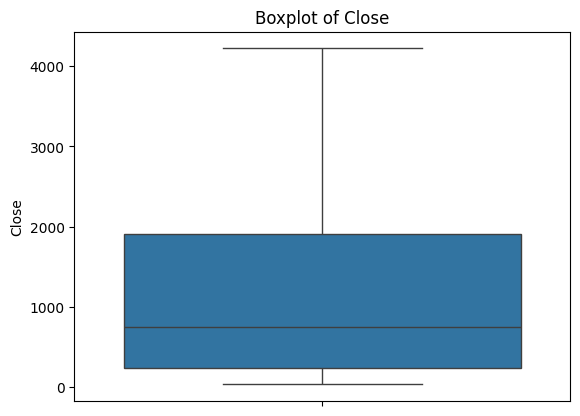

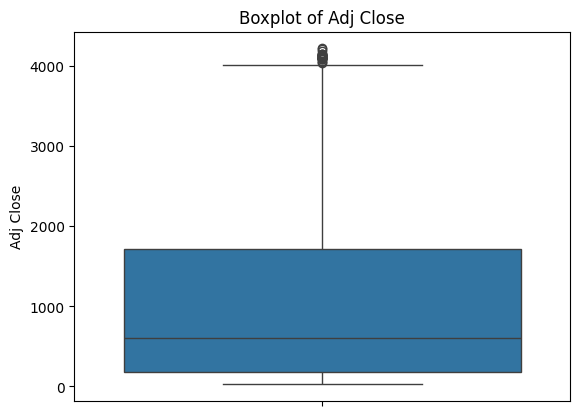

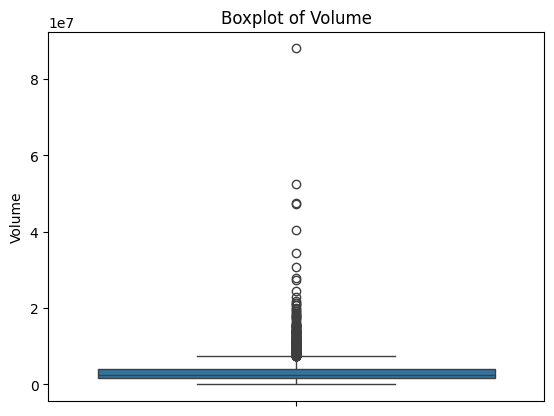

In [8]:
for col in num_cols:
    sns.boxplot(data=df, y=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

**Only Volume column contains outliers, but we are not removing the outliers because it requires a domain expert to decide that.**

# **Visualization of Prices & Volume over Time**

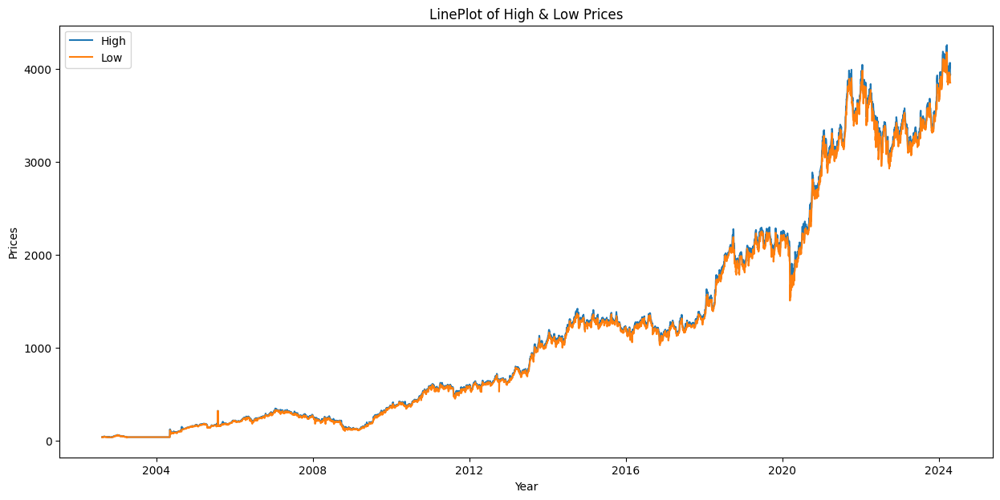

In [9]:
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x='Date', y='High', label='High')
sns.lineplot(data=df, x='Date', y='Low', label='Low')
plt.legend()
plt.title('LinePlot of High & Low Prices')
plt.ylabel('Prices')
plt.xlabel('Year')
plt.show()

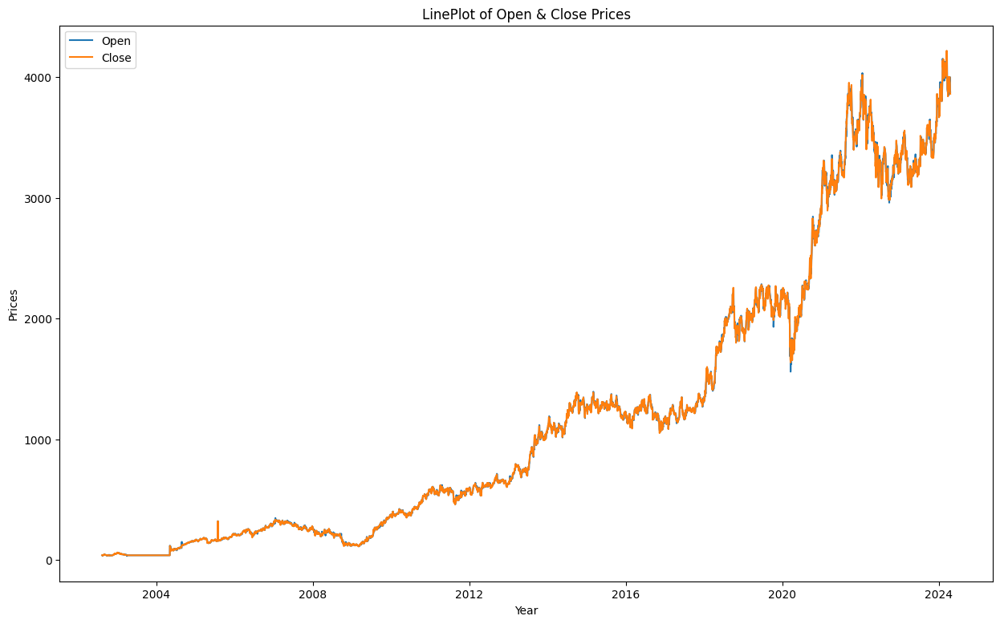

In [10]:
plt.figure(figsize=(15,9))
sns.lineplot(data=df, x='Date', y='Open', label='Open')
sns.lineplot(data=df, x='Date', y='Close', label='Close')
plt.legend()
plt.title('LinePlot of Open & Close Prices')
plt.ylabel('Prices')
plt.xlabel('Year')
plt.show()

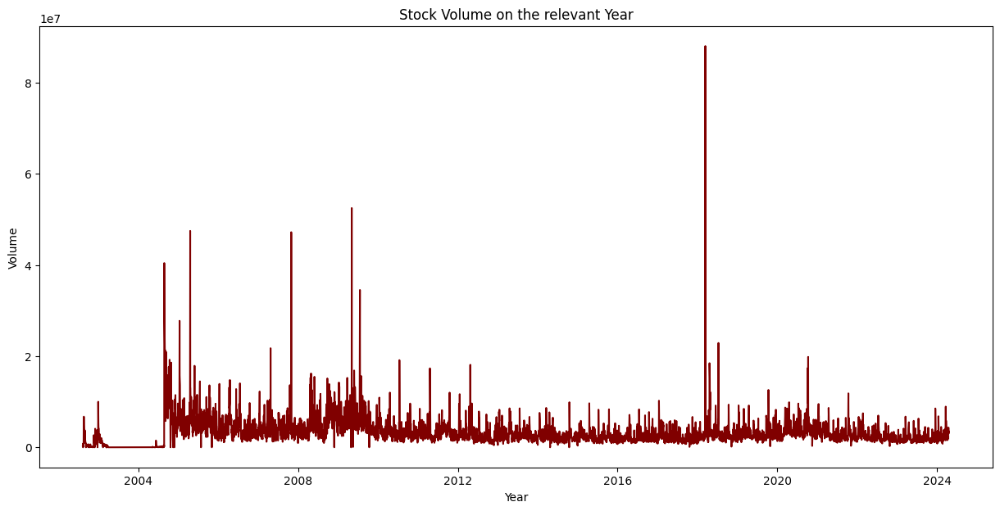

In [11]:
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x='Date', y='Volume',c='maroon')
plt.title('Stock Volume on the relevant Year')
plt.xlabel('Year')
plt.ylabel('Volume')
plt.show()

# **Time Series Analysis on Opening Stock Price using FB-Prophet**

In [12]:
df_open = df[['Date','Open']]
df_open

,Date,Open
0,2002-08-12,38.724998
1,2002-08-13,39.750000
2,2002-08-14,39.250000
3,2002-08-15,36.462502
4,2002-08-16,36.275002
...,...,...
5378,2024-04-10,3956.399902
5379,2024-04-12,3971.000000
5380,2024-04-15,4001.399902
5381,2024-04-16,3902.000000


Renaming the Date columns to ds & Open column to y

In [13]:
df_open.rename(columns={'Date':'ds','Open':'y'},inplace=True)
df_open

/tmp/ipykernel_6209/1185244258.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_open.rename(columns={'Date':'ds','Open':'y'},inplace=True)


,ds,y
0,2002-08-12,38.724998
1,2002-08-13,39.750000
2,2002-08-14,39.250000
3,2002-08-15,36.462502
4,2002-08-16,36.275002
...,...,...
5378,2024-04-10,3956.399902
5379,2024-04-12,3971.000000
5380,2024-04-15,4001.399902
5381,2024-04-16,3902.000000


In [16]:
model_open = Prophet()
model_open.fit(df_open)

17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing


In [17]:
future_open = model_open.make_future_dataframe(periods=365)
future_open.tail()

,ds
5743,2025-04-14
5744,2025-04-15
5745,2025-04-16
5746,2025-04-17
5747,2025-04-18


In [18]:
forecast_open = model_open.predict(future_open)
forecast_open[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
5743,2025-04-14,4300.271394,4064.320491,4535.191792
5744,2025-04-15,4300.735416,4066.823440,4542.611160
5745,2025-04-16,4298.416941,4069.559004,4559.548362
5746,2025-04-17,4299.710189,4065.379134,4524.528931
5747,2025-04-18,4296.708625,4066.663224,4521.400434


In [19]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model_open, forecast_open)

In [20]:

!python -m pip install prophet


In [21]:
plot_components_plotly(model_open, forecast_open)

# **Time Series Analysis on Closing Stock Price using FB-Prophet**

In [22]:
df_close = df[['Date','Close']]
df_close

,Date,Close
0,2002-08-12,39.700001
1,2002-08-13,39.162498
2,2002-08-14,36.462502
3,2002-08-15,36.462502
4,2002-08-16,36.375000
...,...,...
5378,2024-04-10,3984.649902
5379,2024-04-12,4001.399902
5380,2024-04-15,3941.199951
5381,2024-04-16,3872.800049


In [23]:
df_close.rename(columns={'Date':'ds','Close':'y'},inplace=True)
df_close

/tmp/ipykernel_3984/2209883113.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,2002-08-12,39.700001
1,2002-08-13,39.162498
2,2002-08-14,36.462502
3,2002-08-15,36.462502
4,2002-08-16,36.375000
...,...,...
5378,2024-04-10,3984.649902
5379,2024-04-12,4001.399902
5380,2024-04-15,3941.199951
5381,2024-04-16,3872.800049


In [24]:
model_close = Prophet()
model_close.fit(df_close)

17:28:24 - cmdstanpy - INFO - Chain [1] start processing
17:28:28 - cmdstanpy - INFO - Chain [1] done processing


In [25]:
future_close = model_close.make_future_dataframe(periods=765)
future_close.tail()

,ds
6143,2026-05-19
6144,2026-05-20
6145,2026-05-21
6146,2026-05-22
6147,2026-05-23


In [26]:
forecast_close = model_close.predict(future_close)
forecast_close[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
6143,2026-05-19,4695.761901,4393.773880,5003.813278
6144,2026-05-20,4694.226006,4396.058847,4992.566433
6145,2026-05-21,4696.336881,4381.716848,5028.636559
6146,2026-05-22,4695.423631,4411.265610,5005.155824
6147,2026-05-23,4707.907994,4400.821204,5024.968173


In [27]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model_close, forecast_close)

In [28]:
plot_components_plotly(model_close, forecast_close)

# **Time Series Analysis on Stock Volume using FB-Prophet¶**

In [70]:
df_volume = df[['Date','Volume']]
df_volume

,Date,Volume
0,2002-08-12,212976
1,2002-08-13,153576
2,2002-08-14,822776
3,2002-08-15,0
4,2002-08-16,811856
...,...,...
5378,2024-04-10,2101965
5379,2024-04-12,4354821
5380,2024-04-15,4200329
5381,2024-04-16,3051420


In [71]:
df_volume.rename(columns={'Date':'ds','Volume':'y'},inplace=True)
df_volume

/tmp/ipykernel_14262/1710543927.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,2002-08-12,212976
1,2002-08-13,153576
2,2002-08-14,822776
3,2002-08-15,0
4,2002-08-16,811856
...,...,...
5378,2024-04-10,2101965
5379,2024-04-12,4354821
5380,2024-04-15,4200329
5381,2024-04-16,3051420


In [72]:
model_volume = Prophet()
model_volume.fit(df_volume)

11:37:21 - cmdstanpy - INFO - Chain [1] start processing
11:37:28 - cmdstanpy - INFO - Chain [1] done processing


In [73]:
future_volume = model_volume.make_future_dataframe(periods=365)
future_volume.tail()

,ds
5743,2025-04-14
5744,2025-04-15
5745,2025-04-16
5746,2025-04-17
5747,2025-04-18


In [74]:
forecast_volume = model_volume.predict(future_volume)
forecast_volume[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
5743,2025-04-14,1.951805e+06,-1.894327e+06,5.758784e+06
5744,2025-04-15,2.313349e+06,-1.490977e+06,5.838958e+06
5745,2025-04-16,2.487589e+06,-1.230300e+06,6.020500e+06
5746,2025-04-17,2.752962e+06,-1.009256e+06,6.122072e+06
5747,2025-04-18,2.668839e+06,-8.009433e+05,6.165420e+06


In [75]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model_volume, forecast_volume)


In [76]:
plot_components_plotly(model_volume, forecast_volume)

In [80]:
from prophet.serialize import model_to_json, model_from_json

with open('serialized_prophet.json', 'w') as fout:
    fout.write(model_to_json(model_close))  # Save model


In [82]:
with open('serialized_prophet.json', 'r') as fin:
    prophet_close = model_from_json(fin.read())  # Load model